#Voting

Intersection-based Voting

---



---




1.   Applica SAM su ciascun input: Ottieni 3 set di maschere: M_RGB, M_ExG, M_TGI
2.   Filtra le maschere in ogni set: area, roundness, stability score, eccentricità...
3. Allinea e confronta le maschere tra gli input : Usa IoU per confrontare le maschere tra RGB/ExG/TGI. Se una maschera di M_RGB ha IoU > soglia con maschere sia in M_ExG che M_TGI, aumenta il voting_score.
4. Seleziona le maschere con voting_score >= threshold, Maschere confermate da più input = più robuste.



---



---



In [ ]:
# Pseudocodice per selezionare le maschere "ottimali" dopo l'applicazione dei filtri
    Per ciascuna maschera_rgb in mascherine_RGB:
        Estrai la segmentazione binaria corrente da maschera_rgb

        Per ciascuna maschera_blue in mascherine_BLU:
            Calcola l'IoU tra maschera_rgb e maschera_blue
            Moltiplica l'IoU per peso_BLU per ottenere lo score
            Se lo score è maggiore dello score massimo registrato:
                Aggiorna lo score massimo BLU
                Salva la maschera_blue come miglior match per BLU

        Inizializza score massimo per canale EXG a 0
        Inizializza best_match per EXG a None

        Per ciascuna maschera_exg in mascherine_EXG:
            Calcola l'IoU tra maschera_rgb e maschera_exg
            Moltiplica l'IoU per peso_EXG per ottenere lo score
            Se lo score è maggiore dello score massimo registrato:
                Aggiorna lo score massimo EXG
                Salva la maschera_exg come miglior match per EXG

        Confronta lo score massimo BLU con quello EXG:
            Se EXG ha score maggiore:
                final_score ← score_EXG
                best_match ← maschera_exg corrispondente
            Altrimenti:
                final_score ← score_BLU
                best_match ← maschera_blue corrispondente

        Aggiungi alla lista voti_mascherine la tupla (best_match, final_score)

    Restituisci la lista voti_mascherine

In [ ]:
Input:
    - masks_RGB: Set of segmentation masks derived from the RGB image
    - masks_BLUE: Set of segmentation masks derived from the Blue channel
    - masks_EXG: Set of segmentation masks derived from the ExG vegetation index
    - weight_BLUE: Scalar weight assigned to the IoU computed with masks from the Blue channel
    - weight_EXG: Scalar weight assigned to the IoU computed with masks from the ExG channel

Output:
    - voted_masks: A list of tuples, each containing the best-matching mask and its corresponding weighted score

Procedure:
    Initialize an empty list voted_masks

    For each mask_rgb in masks_RGB do:
        Let bin_rgb ← binary segmentation array of mask_rgb

        Initialize:
            max_score_BLUE ← 0
            best_mask_BLUE ← null

        For each mask_blue in masks_BLUE do:
            Compute iou_score ← IoU(bin_rgb, mask_blue.segmentation)
            Compute weighted_score ← weight_BLUE × iou_score
            If weighted_score > max_score_BLUE then:
                max_score_BLUE ← weighted_score
                best_mask_BLUE ← mask_blue

        Initialize:
            max_score_EXG ← 0
            best_mask_EXG ← null

        For each mask_exg in masks_EXG do:
            Compute iou_score ← IoU(bin_rgb, mask_exg.segmentation)
            Compute weighted_score ← weight_EXG × iou_score
            If weighted_score > max_score_EXG then:
                max_score_EXG ← weighted_score
                best_mask_EXG ← mask_exg

        If max_score_EXG > max_score_BLUE then:
            final_score ← max_score_EXG
            best_match ← best_mask_EXG
        Else:
            final_score ← max_score_BLUE
            best_match ← best_mask_BLUE

        Append (best_match, final_score) to voted_masks

    Return voted_masks



---



---



#Load Raw Images

In [1]:
import cv2
exg_image = cv2.imread('/content/201812_cropped_exg_normalized.png')
exg_image = cv2.cvtColor(exg_image, cv2.COLOR_BGR2RGB)

real_image = cv2.imread('/content/201812_cropped.png')
real_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB)

blue_image = cv2.imread('/content/201812_cropped_blue.png')
blue_image = cv2.cvtColor(blue_image, cv2.COLOR_BGR2RGB)

# Ridimensionare l'immagine
def resize_image(image):
    scale_percent = 20
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    resized_image = cv2.resize(image, (width, height), interpolation=cv2.INTER_AREA)
    return resized_image

exg_image_resized = resize_image(exg_image)
real_image_resized = resize_image(real_image)
blue_image_resized = resize_image(blue_image)

#Load pkl

In [2]:
# Caricamento pkl

import pickle
with open('/content/masks_sam_filtered.pkl', 'rb') as f:
    real_masks = pickle.load(f)

with open('/content/masks_blue_filtered.pkl', 'rb') as f:
    blue_masks = pickle.load(f)

with open('/content/masks_exg_filtered.pkl', 'rb') as f:
    exg_masks = pickle.load(f)

print(f"Real Masks Loaded: {len(real_masks)}")
print(f"ExG Masks Loaded: {len(exg_masks)}")
print(f"Blue Band Masks Loaded: {len(blue_masks)}")

Real Masks Loaded: 70
ExG Masks Loaded: 61
Blue Band Masks Loaded: 70


In [3]:
# check on dicts structure

print(real_masks[0].keys())
print(exg_masks[0].keys())
print(blue_masks[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box', 'id', 'real_area', 'roundness', 'eccentricity'])
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box', 'id', 'real_area', 'roundness', 'eccentricity'])
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box', 'id', 'real_area', 'roundness', 'eccentricity'])


#Merged Masks Visualisation

In [4]:
import numpy as np
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True) #ordina le maschere per ordine di area
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4)) #crea immagine RGBA trasparente
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]]) #colore casuale per ogni maschera più trasparenza
        img[m] = color_mask
    ax.imshow(img)

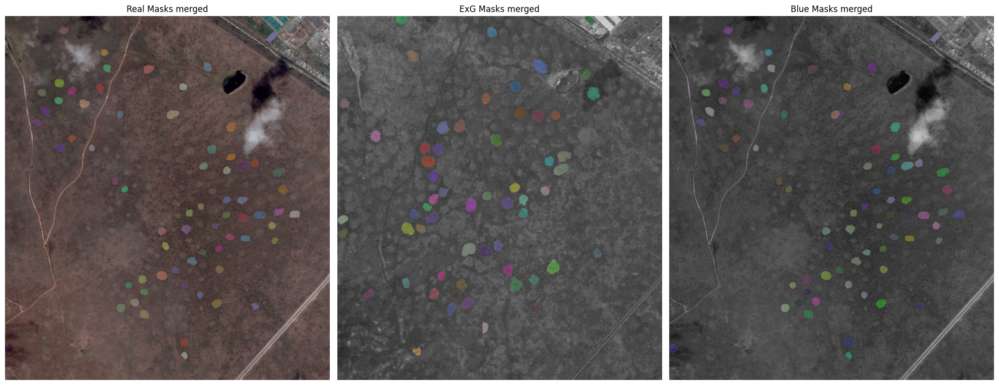

In [5]:
# Visualisation
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(20, 20))

# Sx: Real Image
plt.sca(axs[0])
axs[0].imshow(real_image_resized)
show_anns(real_masks)
axs[0].axis('off')
axs[0].set_title("Real Masks merged")

# Center: ExG image
plt.sca(axs[1])
axs[1].imshow(exg_image_resized)
show_anns(exg_masks)
axs[1].axis('off')
axs[1].set_title("ExG Masks merged")

# Dx: Blue image
plt.sca(axs[2])
axs[2].imshow(blue_image_resized)
show_anns(blue_masks)
axs[2].axis('off')
axs[2].set_title("Blue Masks merged")

plt.tight_layout()
plt.show()

In [19]:
def iou(mask1, mask2):
    """Calcola l'intersezione su unione (IoU) tra due maschere binarie."""
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    if union == 0:
        return 0.0
    else:
        return intersection / union

In [20]:
def compute_mask_votes(masks_rgb, masks_blue, masks_exg, weight_blue=0.6, weight_exg=0.8):
    """Calcola lo score migliore tra Blue e ExG per ogni maschera RGB."""
    voted_masks = []

    for mask_rgb in masks_rgb:
        bin_rgb = mask_rgb['segmentation']

        # MAx score for Blue Channle
        blue_score = 0
        best_blue_mask = None
        for mask_blue in masks_blue:
            bin_blue = mask_blue['segmentation']
            iou_score = iou(bin_rgb, bin_blue)
            score = weight_blue * iou_score
            if score > blue_score:
                blue_score = score
                best_blue_mask = mask_blue

        # MAx Score for ExG channel
        exg_score = 0
        best_exg_mask = None
        for mask_exg in masks_exg:
            bin_exg = mask_exg['segmentation']
            iou_score = iou(bin_rgb, bin_exg)
            score = weight_exg * iou_score
            if score > exg_score:
                exg_score = score
                best_exg_mask = mask_exg

        # Store the max between scores
        if exg_score > blue_score:
            final_score = exg_score
            best_match_mask = best_exg_mask
            channel = "ExG"
        else:
            final_score = blue_score
            best_match_mask = best_blue_mask
            channel = "Blue"

        voted_masks.append((best_match_mask, final_score))

    return voted_masks

In [21]:
matches_3 = compute_mask_votes(real_masks, blue_masks, exg_masks)
print(f"Computed {len(matches_3)} matches")

Computed 70 matches


In [22]:
def filter_matches_by_score(matches, threshold=0.5):
    """
    Filtra una lista di match (masks, score) mantenendo solo quelli con score >= threshold.

    Args:
        matches (list of tuples): lista di tuple (masks, score)
        threshold (float): soglia di filtro per lo score (es. IoU)

    Returns:
        list of tuples: match filtrati
    """
    return [mask for mask, score in matches if score >= threshold]

In [23]:
filtered_matches_3 = filter_matches_by_score(matches_3, threshold=0.6)

print(len(filtered_matches_3))

70


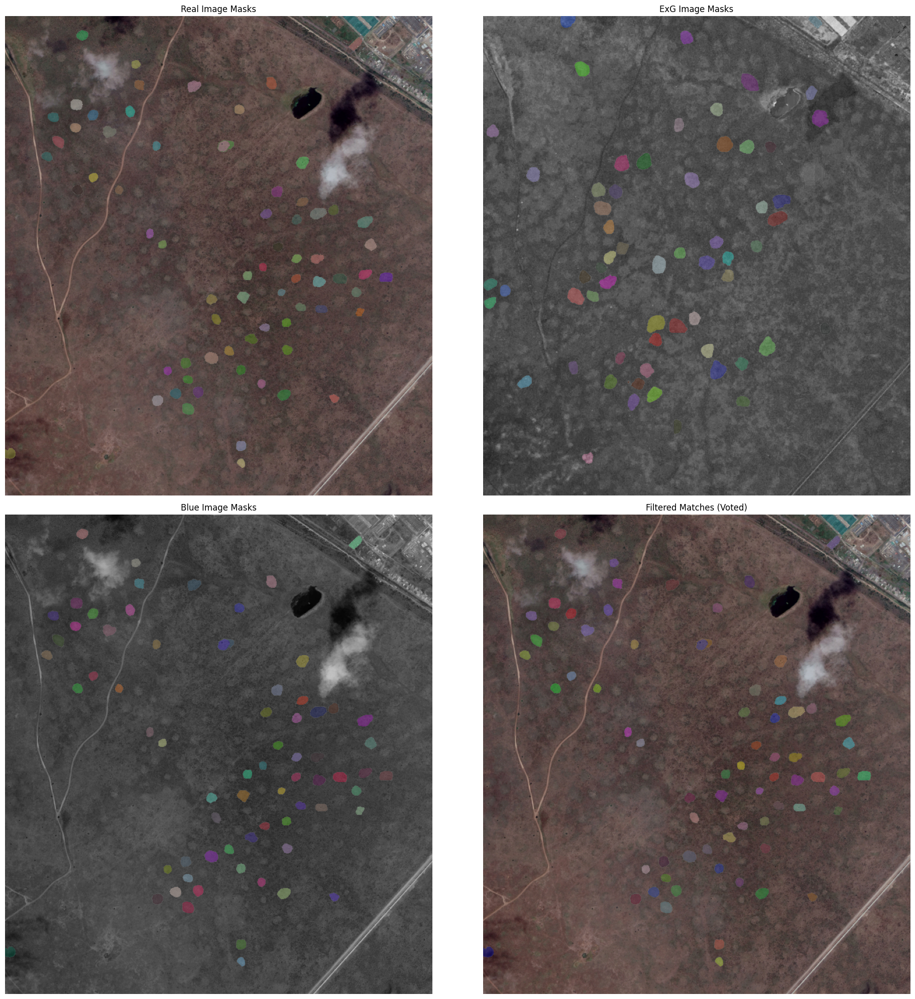

In [24]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(20, 20))

# Plot: Real Image
plt.sca(axs[0, 0])
axs[0, 0].imshow(real_image_resized)
show_anns(real_masks)
axs[0, 0].set_axis_off()
axs[0, 0].set_title("Real Image Masks")

# Plot: ExG Image Mask
plt.sca(axs[0, 1])
axs[0, 1].imshow(exg_image_resized)
show_anns(exg_masks)
axs[0, 1].set_axis_off()
axs[0, 1].set_title("ExG Image Masks")

# Plot: Blue Image Mask
plt.sca(axs[1, 0])
axs[1, 0].imshow(blue_image_resized)
show_anns(blue_masks)
axs[1, 0].set_axis_off()
axs[1, 0].set_title("Blue Image Masks")

# Plot: Voted Mask on Real
plt.sca(axs[1, 1])
axs[1, 1].imshow(real_image_resized)
show_anns(filtered_matches_3)
axs[1, 1].set_axis_off()
axs[1, 1].set_title("Filtered Matches (Voted)")


plt.tight_layout()
plt.show()

In [ ]:
import pickle

with open('masks_rgb_blue_exg_voted.pkl', 'wb') as f:
    pickle.dump(filtered_matches_3, f)

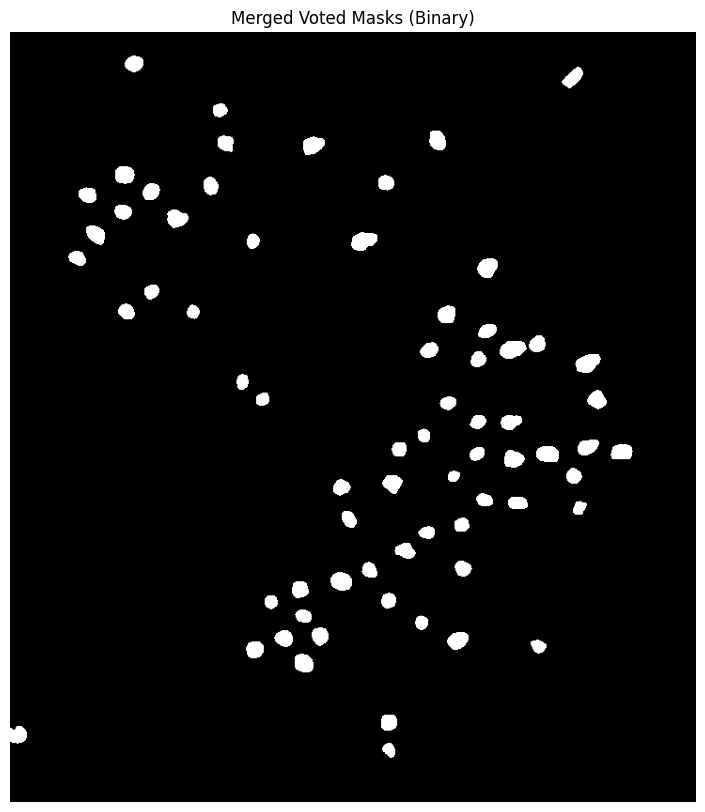

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
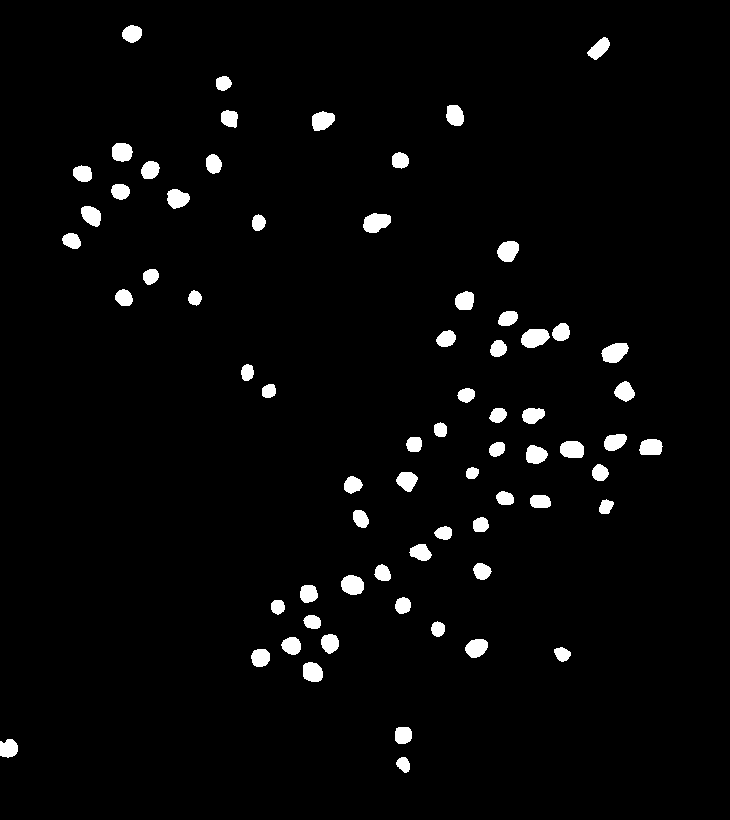

In [ ]:
import numpy as np

def merge_masks_to_binary_image(filtered_matches, image):
    image_shape = image.shape[:2]
    merged_mask = np.zeros(image_shape, dtype=bool)

    for mask in filtered_matches:
        merged_mask = np.logical_or(merged_mask, mask['segmentation'])

    binary_image = (merged_mask * 255).astype(np.uint8)

    # Visualizzazione
    import matplotlib.pyplot as plt
    plt.figure(figsize=(10, 10))
    plt.imshow(binary_image, cmap='gray')
    plt.axis('off')
    plt.title("Merged Voted Masks (Binary)")
    plt.show()
    return binary_image

merge_masks_to_binary_image(filtered_matches_3, real_image_resized)

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from scipy.ndimage import center_of_mass

def show_anns_with_ids(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True) #ordina le maschere per ordine di area
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4)) #crea immagine RGBA trasparente
    img[:,:,3] = 0

    np.random.seed(42)  # For reproducibility of colors
    for ann in sorted_anns:
        idx = ann['id']
        m = ann['segmentation']
        color = np.random.rand(3)
        color_mask = np.concatenate([color, [0.35]])
        img[m] = color_mask

        # Trova il centroide e sposta il testo accanto
        cy, cx = center_of_mass(m)
        text_offset_x = 10  # distanza a destra del centroide
        text_offset_y = 0   # nessuno spostamento verticale

        ax.text(cx + text_offset_x, cy + text_offset_y, str(idx), fontsize=8,
                color='white', ha='left', va='center')

    ax.imshow(img)

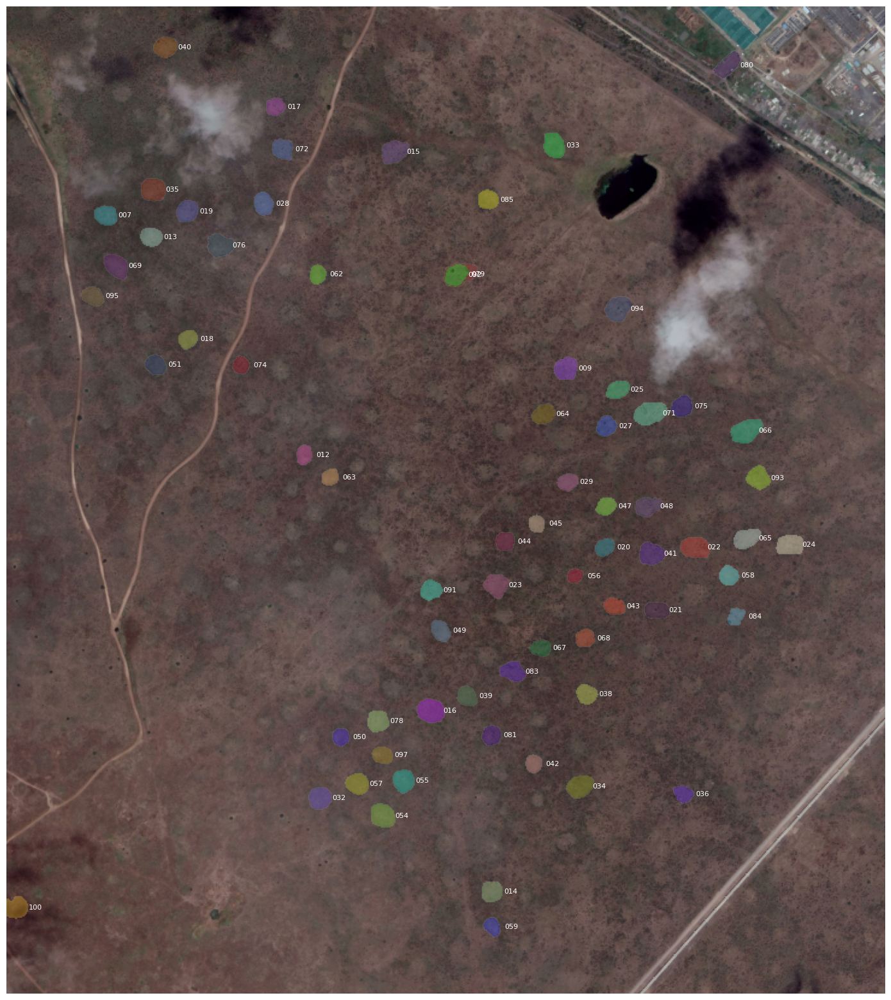

In [26]:
plt.figure(figsize=(20, 20))
plt.imshow(real_image_resized)
show_anns_with_ids(filtered_matches_3)
plt.axis('off')
plt.show()